# Differential Gene Expression Analysis of shRNA targetings of the NYNRIN gene

In [1]:

import numpy as np
import pandas as pd
import scanpy as sc
# import gseapy
import matplotlib.pyplot as plt
import warnings
import os
import subprocess
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [2]:
results_dir = "/gpfs/Labs/Uzun/RESULTS/GRANT_APPS/2025.NYNRIN.DOD.ELCHEVA"

metadata_file = "/gpfs/Labs/Uzun/METADATA/GRANT_APPS/2025.NYNRIN.DOD.ELCHEVA/Sample_Annotation.BATCH_2025_01.txt"
comparison_file = "/gpfs/Labs/Uzun/METADATA/GRANT_APPS/2025.NYNRIN.DOD.ELCHEVA/Comparisons.BATCH_2025_01.txt"

gene_count_dir = os.path.join(results_dir, "gene_counts")

In [3]:
comparison_df = pd.read_csv(comparison_file, sep="\t", header=0, index_col=0)
comparison_df

,Group_1,Group_2
Comparison_Id,,
Comp_01,KG1A_shCNTL,KG1A_shNYN4
Comp_02,K562_shCNTL,K562_shNYN3
Comp_03,K562_shCNTL,K562_shNYN4
Comp_04,SKNAS_shCNTL,SKNAS_shNYN4


In [4]:

metadata = pd.read_csv(metadata_file, sep="\t", header=0, index_col=0)
metadata

,Group_Name
Sample_Name,
KG1A_shCNTL_Rep1,KG1A_shCNTL
KG1A_shNYN4_Rep1,KG1A_shNYN4
KG1A_shCNTL_Rep2,KG1A_shCNTL
KG1A_shNYN4_Rep2,KG1A_shNYN4
KG1A_shCNTL_Rep3,KG1A_shCNTL
KG1A_shNYN4_Rep3,KG1A_shNYN4
K562_shCNTL_Rep1,K562_shCNTL
K562_shNYN3_Rep1,K562_shNYN3
K562_shNYN4_Rep1,K562_shNYN4


Build a counts matrix with the samples as columns and the Ensembl gene ID's as rows

In [5]:
sample_names = metadata.index.to_list()

gene_count_df_list = []
for file in os.listdir(gene_count_dir):
    sample_name = file.replace("_gene_counts.txt", "")     
    filepath = os.path.join(gene_count_dir, file)

    test_gene_count_df = pd.read_csv(
        filepath, 
        sep="\t", 
        header=0, 
        skiprows=1,
        )
    test_gene_count_df = test_gene_count_df.rename(columns={
        test_gene_count_df.columns[-1] : sample_name
        })
    test_gene_count_df["Geneid"] = test_gene_count_df["Geneid"].str.replace(r'\.\d+$', '', regex=True)
    test_gene_count_df = test_gene_count_df[["Geneid", sample_name]].set_index("Geneid")
    gene_count_df_list.append(test_gene_count_df)
    
counts = pd.concat(gene_count_df_list, axis=1, join="inner")
counts

,KG1A_shNYN4_Rep1,SKNAS_shCNTL_Rep1,K562_shNYN4_Rep1,K562_shNYN3_Rep1,KG1A_shCNTL_Rep1,SKNAS_shCNTL_Rep3,KG1A_shCNTL_Rep3,K562_shNYN4_Rep3,K562_shNYN4_Rep2,K562_shCNTL_Rep3,...,SKNAS_shCNTL_Rep2,SKNAS_shNYN4_Rep1,KG1A_shNYN4_Rep2,KG1A_shCNTL_Rep2,SKNAS_shNYN4_Rep2,SKNAS_shNYN4_Rep3,K562_shCNTL_Rep1,KG1A_shNYN4_Rep3,K562_shNYN3_Rep3,K562_shNYN3_Rep2
Geneid,,,,,,,,,,,,,,,,,,,,,
ENSG00000223972,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSG00000227232,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSG00000278267,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSG00000243485,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSG00000284332,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000198695,219,308,586,706,449,362,881,285,290,306,...,202,292,194,410,329,350,1496,497,193,321
ENSG00000210194,13,3,0,52,23,0,38,5,0,0,...,2,57,5,22,19,4,51,0,6,4
ENSG00000198727,52179,166499,33968,48073,65440,193669,68989,17561,25055,28410,...,115593,97526,62925,86116,111988,129783,45432,72698,21235,28608


Filter to only keep rows with at least one gene expressed

In [6]:
counts = counts[counts.sum(axis=1) > 0]
counts

,KG1A_shNYN4_Rep1,SKNAS_shCNTL_Rep1,K562_shNYN4_Rep1,K562_shNYN3_Rep1,KG1A_shCNTL_Rep1,SKNAS_shCNTL_Rep3,KG1A_shCNTL_Rep3,K562_shNYN4_Rep3,K562_shNYN4_Rep2,K562_shCNTL_Rep3,...,SKNAS_shCNTL_Rep2,SKNAS_shNYN4_Rep1,KG1A_shNYN4_Rep2,KG1A_shCNTL_Rep2,SKNAS_shNYN4_Rep2,SKNAS_shNYN4_Rep3,K562_shCNTL_Rep1,KG1A_shNYN4_Rep3,K562_shNYN3_Rep3,K562_shNYN3_Rep2
Geneid,,,,,,,,,,,,,,,,,,,,,
ENSG00000243485,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSG00000238009,0,0,0,31,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
ENSG00000268903,0,0,48,22,0,0,0,0,52,58,...,0,0,0,0,0,0,77,0,4,27
ENSG00000269981,0,0,12,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSG00000228463,0,0,0,28,0,0,0,12,7,0,...,0,0,0,0,0,4,25,0,14,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000198695,219,308,586,706,449,362,881,285,290,306,...,202,292,194,410,329,350,1496,497,193,321
ENSG00000210194,13,3,0,52,23,0,38,5,0,0,...,2,57,5,22,19,4,51,0,6,4
ENSG00000198727,52179,166499,33968,48073,65440,193669,68989,17561,25055,28410,...,115593,97526,62925,86116,111988,129783,45432,72698,21235,28608


pyDESeq2 requires genes as columns and samples as rows

In [7]:
counts = counts.T
counts

Geneid,ENSG00000243485,ENSG00000238009,ENSG00000268903,ENSG00000269981,ENSG00000228463,ENSG00000286448,ENSG00000237094,ENSG00000225972,ENSG00000225630,ENSG00000237973,...,ENSG00000198886,ENSG00000210176,ENSG00000210184,ENSG00000210191,ENSG00000198786,ENSG00000198695,ENSG00000210194,ENSG00000198727,ENSG00000210195,ENSG00000210196
KG1A_shNYN4_Rep1,0,0,0,0,0,0,0,11760,40,196,...,64230,40,61,11,9165,219,13,52179,20,251
SKNAS_shCNTL_Rep1,0,0,0,0,0,0,0,135,316,51,...,339713,39,131,23,28630,308,3,166499,78,583
K562_shNYN4_Rep1,0,0,48,12,0,0,0,112,10,5,...,70829,60,71,49,10903,586,0,33968,152,298
K562_shNYN3_Rep1,0,31,22,0,28,25,6,97,68,18,...,86284,102,203,144,10072,706,52,48073,262,481
KG1A_shCNTL_Rep1,0,0,0,0,0,0,0,15418,53,263,...,86296,72,54,11,10875,449,23,65440,41,410
SKNAS_shCNTL_Rep3,0,0,0,0,0,0,0,193,426,24,...,316546,6,63,10,27752,362,0,193669,70,313
KG1A_shCNTL_Rep3,0,0,0,0,0,0,0,19719,124,359,...,103462,87,132,52,15847,881,38,68989,93,846
K562_shNYN4_Rep3,1,0,0,0,12,27,0,56,42,12,...,39462,52,59,18,5883,285,5,17561,33,91
K562_shNYN4_Rep2,0,1,52,0,7,16,0,78,34,14,...,55363,31,98,11,7927,290,0,25055,104,222
K562_shCNTL_Rep3,0,0,58,0,0,21,0,58,42,3,...,58983,55,50,24,6910,306,0,28410,108,181


In [8]:
metadata.reindex()
metadata

,Group_Name
Sample_Name,
KG1A_shCNTL_Rep1,KG1A_shCNTL
KG1A_shNYN4_Rep1,KG1A_shNYN4
KG1A_shCNTL_Rep2,KG1A_shCNTL
KG1A_shNYN4_Rep2,KG1A_shNYN4
KG1A_shCNTL_Rep3,KG1A_shCNTL
KG1A_shNYN4_Rep3,KG1A_shNYN4
K562_shCNTL_Rep1,K562_shCNTL
K562_shNYN3_Rep1,K562_shNYN3
K562_shNYN4_Rep1,K562_shNYN4


Make sure that the samples in the counts matrix are the same as in the metadata, otherwise pyDESeq2 has a hissy-fit

In [9]:


counts.index = counts.index.str.strip()
metadata.index = metadata.index.str.strip()

missing_in_meta   = counts.index.difference(metadata.index)
missing_in_counts = metadata.index.difference(counts.index)
if len(missing_in_meta) or len(missing_in_counts):
    print("In counts but not metadata:", list(missing_in_meta))
    print("In metadata but not counts:", list(missing_in_counts))
    common = counts.index.intersection(metadata.index)
    counts   = counts.loc[common]
    metadata = metadata.loc[common]
counts = counts.reindex(metadata.index)
assert counts.index.equals(metadata.index)

In [10]:
dds = DeseqDataSet(
    counts=counts, 
    metadata=metadata,
    design="Group_Name"
    )

We can now run DESeq2, which calculates a bunch of stats on the data.

In [11]:
dds.deseq2()

Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 3.77 seconds.

Fitting dispersion trend curve...
... done in 0.52 seconds.

Fitting MAP dispersions...
... done in 3.49 seconds.

Fitting LFCs...
... done in 3.62 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 0 outlier genes.



In [12]:
dds

AnnData object with n_obs × n_vars = 21 × 28988
    obs: 'Group_Name', 'size_factors', 'replaceable'
    var: '_normed_means', 'non_zero', '_MoM_dispersions', 'genewise_dispersions', '_genewise_converged', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', '_LFC_converged', 'replaced', 'refitted', '_pvalue_cooks_outlier'
    uns: 'trend_coeffs', 'disp_function_type', '_squared_logres', 'prior_disp_var'
    obsm: 'design_matrix', '_mu_LFC', '_hat_diagonals'
    varm: 'LFC'
    layers: 'normed_counts', '_mu_hat', 'cooks'

Look at the comparisons that we want to make

In [13]:
comparison_df

,Group_1,Group_2
Comparison_Id,,
Comp_01,KG1A_shCNTL,KG1A_shNYN4
Comp_02,K562_shCNTL,K562_shNYN3
Comp_03,K562_shCNTL,K562_shNYN4
Comp_04,SKNAS_shCNTL,SKNAS_shNYN4


Run the first comparison, KG1A_shCNTL vs KG1A_shNYN4

In [14]:
stat_res = DeseqStats(dds, n_cpus=8, contrast = ('Group_Name', 'KG1A_shCNTL', 'KG1A_shNYN4'))
stat_res.summary()

Running Wald tests...


Log2 fold change & Wald test p-value: Group_Name KG1A_shCNTL vs KG1A_shNYN4
                     baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Geneid                                                                        
ENSG00000243485      0.045112       -0.012289  6.059401 -0.002028  0.998382   
ENSG00000238009      1.299463       -0.012289  6.059401 -0.002028  0.998382   
ENSG00000268903     12.195578       -0.012289  3.488672 -0.003523  0.997189   
ENSG00000269981      0.503678       -0.012289  6.059401 -0.002028  0.998382   
ENSG00000228463      5.018131       -0.012289  3.946291 -0.003114  0.997515   
...                       ...             ...       ...       ...       ...   
ENSG00000198695    405.689477        1.031948  0.580361  1.778114  0.075385   
ENSG00000210194     14.133491        2.030888  1.912974  1.061639  0.288399   
ENSG00000198727  72761.334566        0.228783  0.261585  0.874605  0.381789   
ENSG00000210195     90.132608        0.095060  0.738730

... done in 14.02 seconds.



In [15]:
res = stat_res.results_df
res.head()

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
Geneid,,,,,,
ENSG00000243485,0.045112,-0.012289,6.059401,-0.002028,0.998382,NaN
ENSG00000238009,1.299463,-0.012289,6.059401,-0.002028,0.998382,NaN
ENSG00000268903,12.195578,-0.012289,3.488672,-0.003523,0.997189,0.999627
ENSG00000269981,0.503678,-0.012289,6.059401,-0.002028,0.998382,NaN
ENSG00000228463,5.018131,-0.012289,3.946291,-0.003114,0.997515,NaN


Convert the Ensembl gene IDs to gene symbols

In [16]:
from sanbomics.tools import id_map
mapper = id_map(species = 'human')
mapper.mapper
res['Symbol'] = res.index.map(mapper.mapper)
res

/gpfs/Home/esm5360/miniconda3/envs/bioinformatics/lib/python3.13/site-packages/sanbomics/tools.py:2: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Symbol
Geneid,,,,,,,
ENSG00000243485,0.045112,-0.012289,6.059401,-0.002028,0.998382,NaN,MIR1302-2HG
ENSG00000238009,1.299463,-0.012289,6.059401,-0.002028,0.998382,NaN,AL627309.1
ENSG00000268903,12.195578,-0.012289,3.488672,-0.003523,0.997189,0.999627,NaN
ENSG00000269981,0.503678,-0.012289,6.059401,-0.002028,0.998382,NaN,NaN
ENSG00000228463,5.018131,-0.012289,3.946291,-0.003114,0.997515,NaN,NaN
...,...,...,...,...,...,...,...
ENSG00000198695,405.689477,1.031948,0.580361,1.778114,0.075385,0.701599,MT-ND6
ENSG00000210194,14.133491,2.030888,1.912974,1.061639,0.288399,0.999627,MT-TE
ENSG00000198727,72761.334566,0.228783,0.261585,0.874605,0.381789,0.999627,MT-CYB


Remove genes with low expression (baseMean < 10)

In [17]:
res = res[res.baseMean >= 10]

Isolate genes with a significant differential expression

In [18]:
sigs = res[(res.padj < 0.05) & (abs(res.log2FoldChange) > 0.5)]


PCA Plot

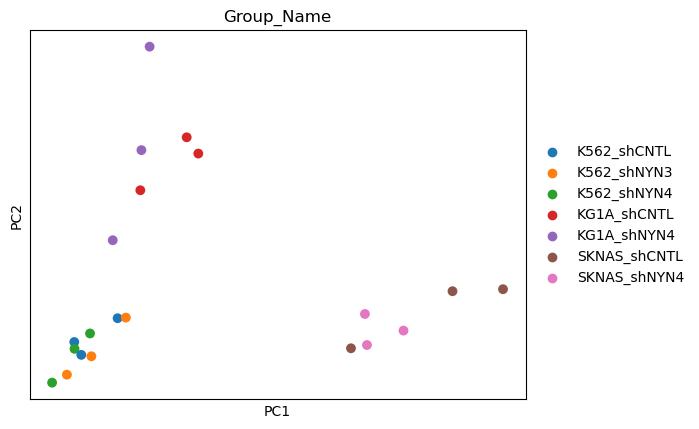

In [19]:
sc.tl.pca(dds)
sc.pl.pca(dds, color='Group_Name', size=200)

GSEA

In [20]:
import gseapy as gp
from gseapy.plot import gseaplot

In [21]:
ranking = res[['Symbol', 'stat']].dropna().sort_values('stat', ascending = False).drop_duplicates()
ranking

,Symbol,stat
Geneid,,
ENSG00000164877,MICALL2,8.196663
ENSG00000137267,TUBB2A,5.967481
ENSG00000070087,PFN2,5.362362
ENSG00000080823,MOK,5.225438
ENSG00000188322,SBK1,5.166317
...,...,...
ENSG00000213995,NAXD,-4.292832
ENSG00000142546,NOSIP,-4.306245
ENSG00000125846,ZNF133,-4.793499


In [22]:
manual_gene_set = {'things':['STAU2', 'USP53', 'SERPINE1', 'TMEM178B', 'PSAP']}

In [23]:
#gp.get_library_name() # to look at available libraries

In [24]:
pre_res = gp.prerank(rnk = ranking,
                     gene_sets= ['GO_Biological_Process_2021', manual_gene_set],
                     seed=6, permutation_num=100)

Convert the output from prerank to a DataFrame

In [25]:
out = []

for term in list(pre_res.results):
    out.append([term,
                pre_res.results[term]['fdr'],
                pre_res.results[term]['es'],
                pre_res.results[term]['nes']])
out_df = pd.DataFrame(out, columns = ['Term', 'fdr', 'es', 'nes']).sort_values('fdr').reset_index(drop=True)
out_df

,Term,fdr,es,nes
0,GO_Biological_Process_2021__ncRNA processing (...,0.0,-0.561906,-2.345900
1,GO_Biological_Process_2021__rRNA processing (G...,0.0,-0.628966,-2.585557
2,GO_Biological_Process_2021__cytoplasmic transl...,0.0,-0.775668,-2.942850
3,GO_Biological_Process_2021__ribosomal large su...,0.0,-0.677748,-2.358590
4,GO_Biological_Process_2021__cotranslational pr...,0.0,-0.775523,-2.915459
...,...,...,...,...
2289,GO_Biological_Process_2021__cAMP-mediated sign...,1.0,0.243844,0.669966
2290,GO_Biological_Process_2021__negative regulatio...,1.0,0.261454,0.744390
2291,GO_Biological_Process_2021__outflow tract sept...,1.0,-0.361630,-0.925493
2292,GO_Biological_Process_2021__positive regulatio...,1.0,-0.216986,-0.823449


In [26]:
out_df.sort_values('nes').iloc[0].Term

'GO_Biological_Process_2021__SRP-dependent cotranslational protein targeting to membrane (GO:0006614)'

/tmp/ipykernel_498772/3430481169.py:14: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


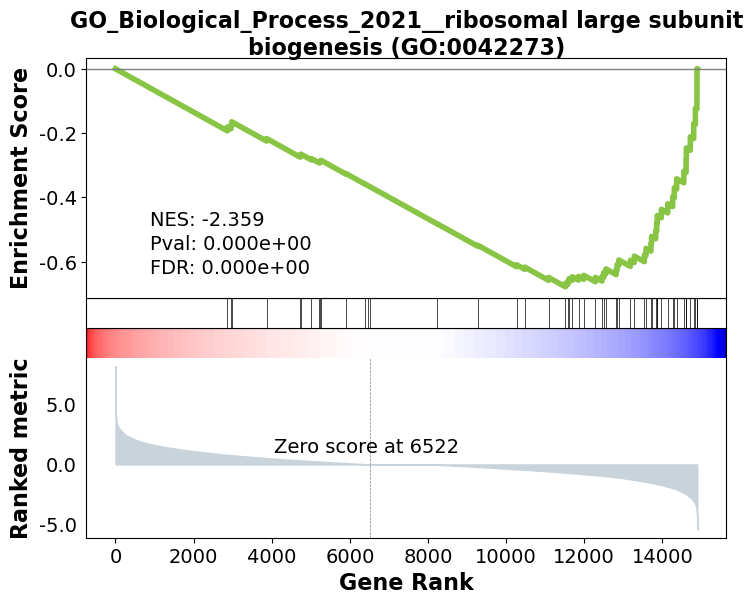

In [27]:
from gseapy.plot import gseaplot2
import matplotlib.pyplot as plt

term = 'GO_Biological_Process_2021__ribosomal large subunit biogenesis (GO:0042273)'
results  = pre_res.results[term]

gseaplot(rank_metric=pre_res.ranking,
          term=term,
          **results,
          figsize=(8,6),     # smaller, tighter
          ofname=None,       # don’t save to file
          title=term.split('__')[-1])  # shorter title

plt.tight_layout()
plt.show()


In [28]:
import numpy as np
import seaborn as sns

In [29]:
dds.layers['log1p'] = np.log1p(dds.layers['normed_counts'])

In [30]:
dds_sigs = dds[:, sigs.index]

In [31]:
comparison_1_samples = comparison_df.iloc[0, :].to_list()

grapher = pd.DataFrame(dds_sigs.layers['log1p'].T,
                       index=dds_sigs.var_names, columns=dds_sigs.obs_names)
grapher.index = grapher.index.map(mapper.mapper)
base = grapher.columns.astype(str).str.split('_Rep', n=1).str[0]
mask = base.isin(comparison_1_samples)
grapher = grapher.loc[:, mask]
grapher = grapher.sort_index(axis=0)

In [32]:
grapher.head()

Sample_Name,KG1A_shCNTL_Rep1,KG1A_shNYN4_Rep1,KG1A_shCNTL_Rep2,KG1A_shNYN4_Rep2,KG1A_shCNTL_Rep3,KG1A_shNYN4_Rep3
Geneid,,,,,,
ABCB8,4.778623,1.973480,4.456246,3.382617,4.433240,3.661595
AC124798.1,0.684529,3.249703,0.000000,2.316874,0.000000,3.724527
AL354872.2,0.000000,4.199817,1.336995,3.541761,0.753478,2.972480
ANKRD34A,3.538535,1.246535,3.673013,0.000000,4.066342,0.000000
ARHGDIA,7.875893,7.646191,7.731443,7.392362,8.024103,7.378613


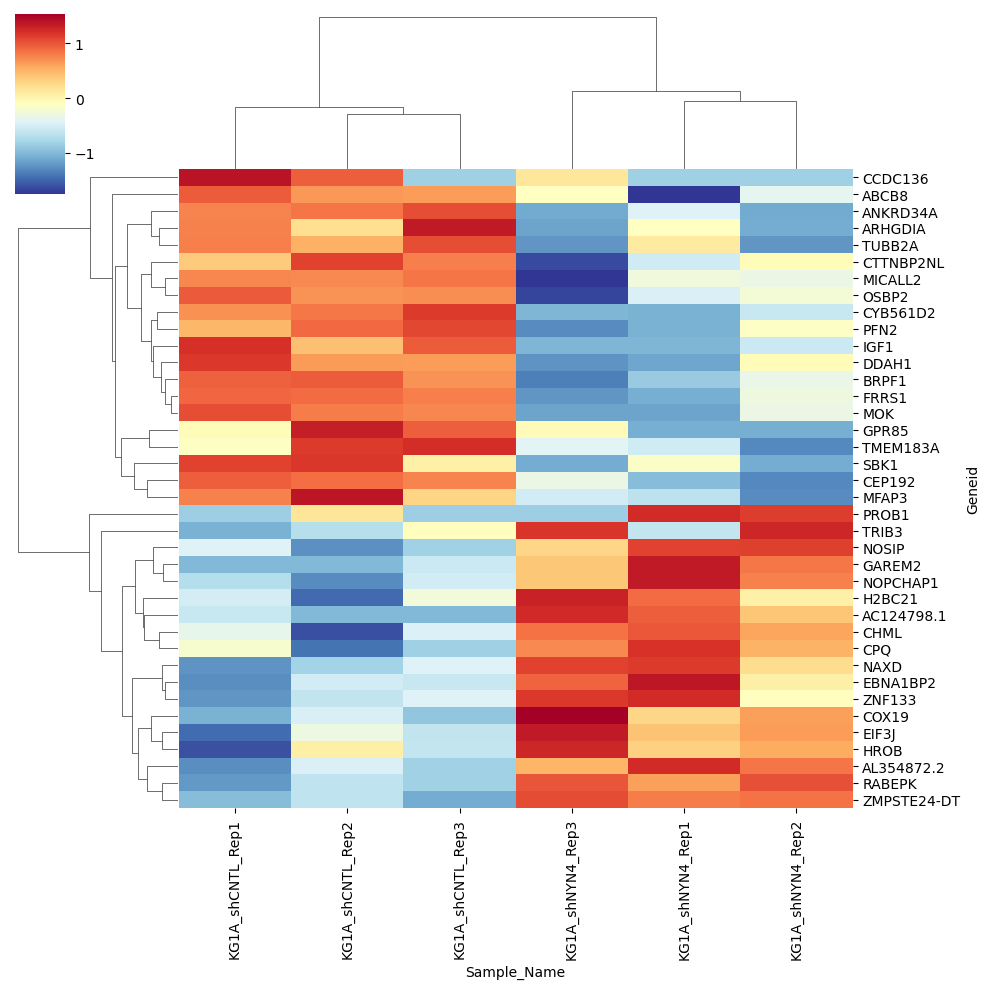

In [33]:
sns.clustermap(grapher, z_score=0, cmap = 'RdYlBu_r')

In [34]:
from sanbomics.plots import volcano

In [35]:
res

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Symbol
Geneid,,,,,,,
ENSG00000268903,12.195578,-0.012289,3.488672,-0.003523,0.997189,0.999627,NaN
ENSG00000225972,4865.755396,0.322907,0.234177,1.378902,0.167925,0.876526,MTND1P23
ENSG00000225630,120.059968,0.131652,0.557586,0.236110,0.813347,0.999627,MTND2P28
ENSG00000237973,96.752689,-0.176629,0.664592,-0.265770,0.790416,0.999627,MTCO1P12
ENSG00000229344,36.155675,1.109167,0.661768,1.676066,0.093725,0.748171,MTCO2P12
...,...,...,...,...,...,...,...
ENSG00000198695,405.689477,1.031948,0.580361,1.778114,0.075385,0.701599,MT-ND6
ENSG00000210194,14.133491,2.030888,1.912974,1.061639,0.288399,0.999627,MT-TE
ENSG00000198727,72761.334566,0.228783,0.261585,0.874605,0.381789,0.999627,MT-CYB


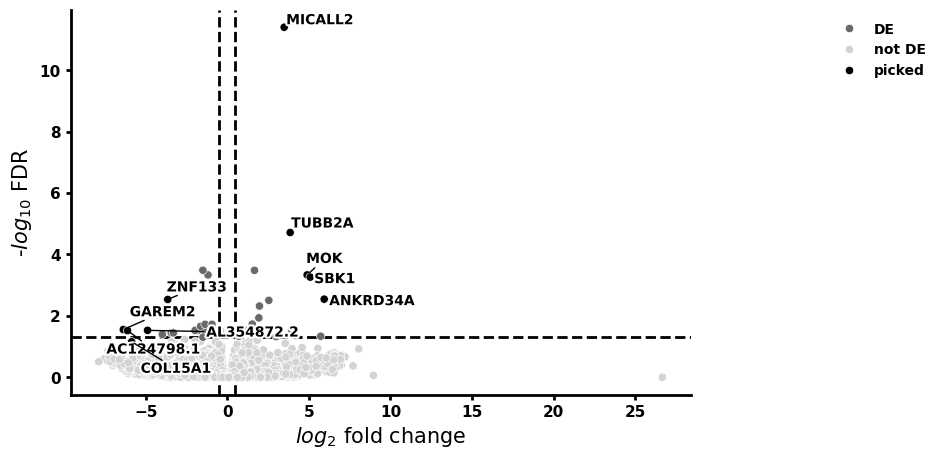

In [36]:
volcano(res, symbol="Symbol", figsize=(8,5), log2fc_thresh=0.5)

In [37]:
annotation_file = "/gpfs/Labs/Uzun/RESULTS/GRANT_APPS/2025.NYNRIN.DOD.ELCHEVA/gene_annotation_lookup.parquet"

annotation_df = pd.read_parquet(annotation_file)

In [38]:
comparisons = [comparison_df.iloc[i, :].to_list() for i in range(len(comparison_df))]
comparisons

[['KG1A_shCNTL', 'KG1A_shNYN4'],
 ['K562_shCNTL', 'K562_shNYN3'],
 ['K562_shCNTL', 'K562_shNYN4'],
 ['SKNAS_shCNTL', 'SKNAS_shNYN4']]

In [40]:
comparisons[0]

['KG1A_shCNTL', 'KG1A_shNYN4']